# Encontro 07

## Materiais de apoio:

* The Scientist and Engineer's Guide to Digital Signal Processing, de By Steven W. Smith, Ph.D. (capítulos 23 até 25)
	* Disponível em http://www.dspguide.com

## Tópicos Abordados:

* Processamento de Imagem em Python:
  * Pacote scikit-image.

* Exemplo de aplicações:
  * Conversão de RBG para Grayscale;
  * Detecção de Bordas;
  * Máscara de Nitidez;
  * Correspondência de Histograma;
  * Correção Gama;
  * Correção Logarítmica;
  * Correção Sigmoide;
  * Equalização de Histograma;
  * Alongamento de Contraste;
  * Equalização Adaptativa de Histograma Limitada por Contraste (CLAHE);
  * Comparação Visual de Imagens:
    * Quadriculado/Tabuleiro de Xadrez;
    * Diferença;
    * Mistura.
  * Remoção de Ruído por Aplicação de Filtro Mediano;
  * Remoção de Ruído por Aplicação de Filtro Médio;
  * Remoção de Ruído por Aplicação de Filtro Médio Bilateral;
  * Limiar (Thresholding);
  * Limiar (Thresholding) Médio;
  * Limiar (Thresholding) Mínimo;
  * Limiar (Thresholding) Local;
  * Esqueletização;
  * Correspondência de Modelo;
  * Restauração de Imagem;
  * Restauração (Deconvolução) por Wiener Não-Supervisionado.


In [1]:
# Importação de módulos e instalação de bibliotecas adicionais

# Importação do pacote matématico Math
import math

# Importação do pacote Pandas
import pandas as pd

# Importação dos pacotes NumPy e SciPy
import numpy as np
from scipy.interpolate import interp1d, interp2d
from scipy import signal, misc, ndimage

# Importação do pacote skimage e alguns componentes
import skimage as skimg
from skimage import morphology
from skimage import feature

# Importação do pacote librosa e alguns componentes
import librosa
import librosa.display

# Importação do pacote SoundFile
!pip install soundfile
import soundfile as sf

# Importação do pacote Padasip
!pip install padasip
import padasip as pa

# Importação do pacote IPython.display
import IPython.display as ipd

# Importação de Widgets
import ipywidgets as widgets

# Importação do pacote PyPlot do MatPlotLib
import matplotlib.pyplot as plt

# Instalação e importação do pacote mpld3
!pip install mpld3
import mpld3

# importação do módulo timeit
import timeit

In [2]:
# Diretiva do Notebook para exibição de gráficos inline
%matplotlib inline

# Configuração do tamanho dos gráficos
plt.rcParams["figure.figsize"] = (30,10)

In [3]:
# Importação de dados do Google Drive

from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

filepath = 'My Drive/Colab Notebooks/pae_maua/encontro_07/'

Mounted at /gdrive
/gdrive


## Processamento de Imagem em Python

## Pacote scikit-image

O pacote scikit-image é uma coleção de algoritmos para processamento de imagem, com grande número de exemplos práticos e aplicações. Sua documentação está disponível em https://scikit-image.org.

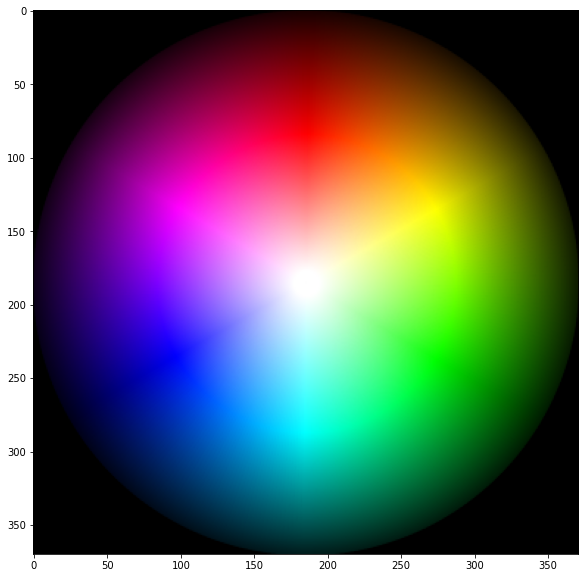

In [4]:
# Exemplo de imagem do pacote skimage

# Carrega imagem de exemplo
image_colorwheel = skimg.data.colorwheel()

# Exibe a imagem pelo MatPlotLib
plt.imshow(image_colorwheel)

## Exemplo de aplicações

### Conversão de RBG para Grayscale

Text(0.5, 1.0, 'Grayscale')

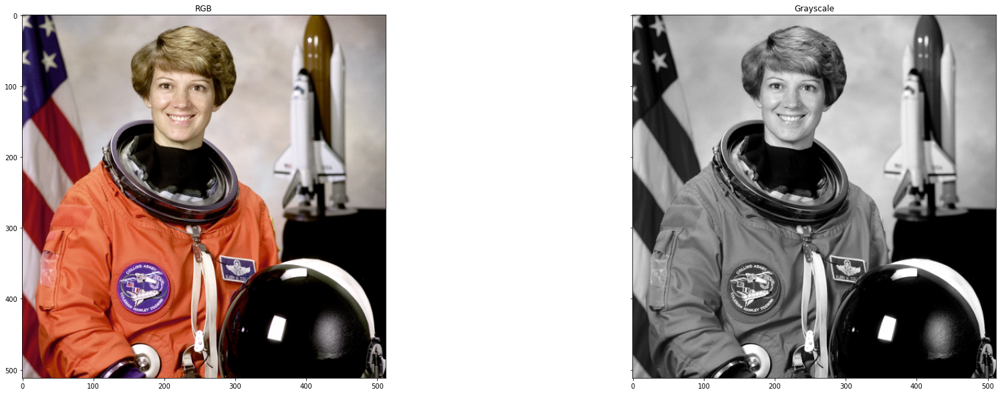

In [5]:
# Exemplo de conversão de RGB para Grayscale

# Carrega imagem de exemplo
image_color = skimg.data.astronaut()

# Converte para grayscale
image_gray = skimg.color.rgb2gray(image_color)

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_color)
ax[0].set_title('RGB')
ax[1].imshow(image_gray, cmap="gray")
ax[1].set_title('Grayscale')

### Detecção de Bordas

Text(0.5, 1.0, 'Detecção de Bordas por Sobel')

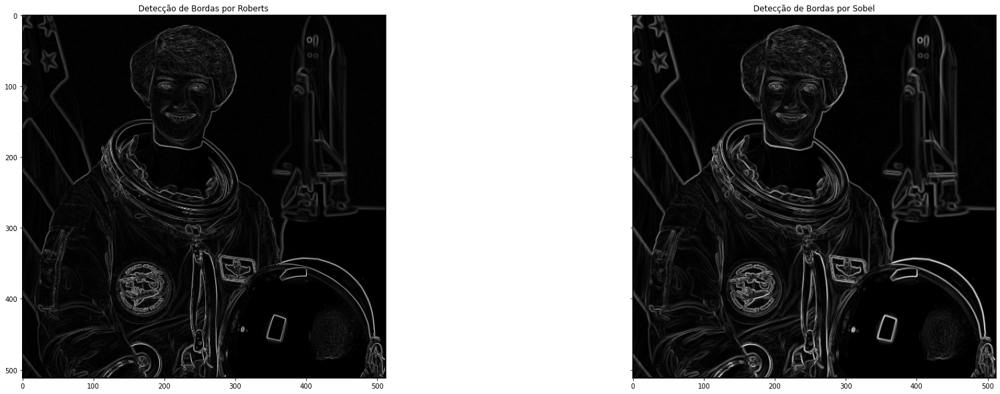

In [6]:
# Exemplo de Detecção de Bordas

# Carrega uma imagem de exemplo
image_base = skimg.data.astronaut()

# Converte de RGB para Grayscale se necessário
if (np.size(np.shape(image_base)) == 3):
  image_base = skimg.color.rgb2gray(image_base)

# Aplicação de Detecção de Bordas
image_edge_roberts = skimg.filters.roberts(image_base)
image_edge_sobel = skimg.filters.sobel(image_base)

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_edge_roberts, cmap='gray')
ax[0].set_title('Detecção de Bordas por Roberts')
ax[1].imshow(image_edge_sobel, cmap='gray')
ax[1].set_title('Detecção de Bordas por Sobel')


### Máscara de Nitidez

A máscara de nitidez é uma técnica linear de processamento que deixa a imagem mais nítida. 


Text(0.5, 1.0, 'Imagem filtrada com Máscara de Nitidez')

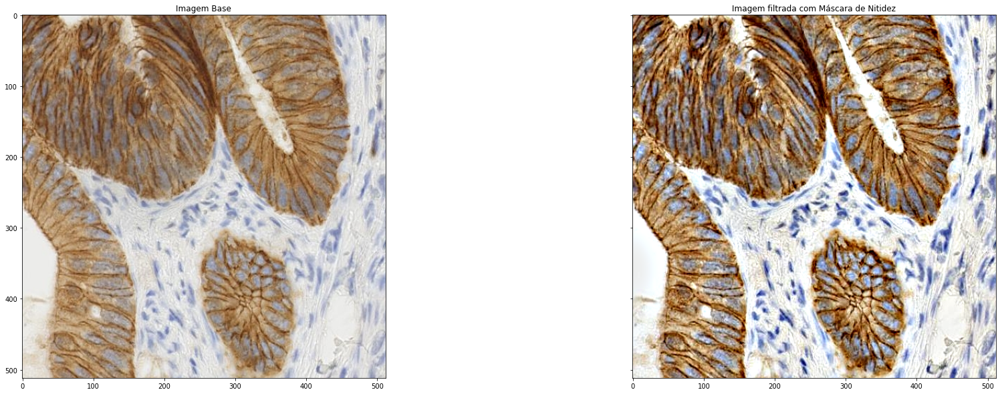

In [7]:
# Exemplo de Máscara de Nitidez

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def unsharp_mask_hsv(image, radius, amount):
  return skimg.filters.unsharp_mask(image, radius=radius, amount=amount)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def unsharp_mask_each(image, radius, amount):
  return skimg.filters.unsharp_mask(image, radius=radius, amount=amount)

# Carrega uma imagem de exemplo
image_base = skimg.data.immunohistochemistry()

# Parâmetros da transformação
radius = 20
amount = 1

# Aplicação da Remoção de Ruído por Aplicação de Filtro Médio Bilateral
image_filtered = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_filtered = skimg.filters.unsharp_mask(image_base, radius=radius, amount=amount)
  colormap = "gray"
else:
  #image_filtered = unsharp_mask_hsv(image_base, radius=radius, amount=amount)
  image_filtered = unsharp_mask_each(image_base, radius=radius, amount=amount)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_filtered, cmap=colormap)
ax[1].set_title('Imagem filtrada com Máscara de Nitidez')

### Correspondência de Histograma

A correspondência de histograma manipula os pixels de uma imagem fonte para que o seu histograma corresponda o de uma imagem de referência. 

Pode ser usado para normalização leve, em especial se duas imagens foram coletadas de fontes diferentes e em condições diferentes (como luminosidade).


Text(0.5, 1.0, 'Correspondente')

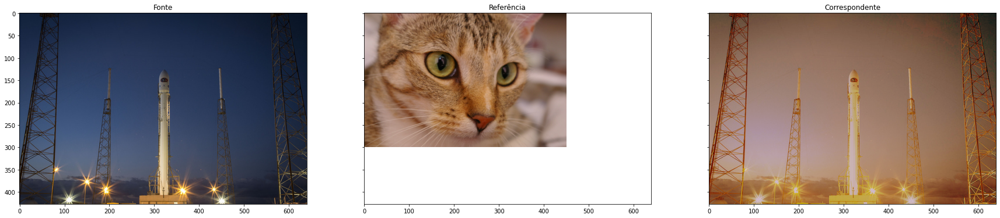

In [8]:
# Exemplo de Correspondência de Histograma (Histogram Matching)

# Carrega imagens fonte e de referência
image_fonte     = skimg.data.rocket()
image_reference = skimg.data.chelsea()

# Realiza a correspondência de histograma
if (np.size(np.shape(image_base)) == 2):
  image_matched = skimg.exposure.match_histograms(image_fonte, image_reference, multichannel=False)
  colormap = "gray"
else:
  image_matched = skimg.exposure.match_histograms(image_fonte, image_reference, multichannel=True)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(image_fonte, cmap=colormap)
ax[0].set_title('Fonte')
ax[1].imshow(image_reference, cmap=colormap)
ax[1].set_title('Referência')
ax[2].imshow(image_matched, cmap=colormap)
ax[2].set_title('Correspondente')

### Correção Gama

A correção Gama, também conhecida como Transformação da Lei de Potência, era originalmente usada para compensar as características de entrada e saída dos displays de tubos de raios catódicos (CRT).

Text(0.5, 1.0, 'Correção Gama')

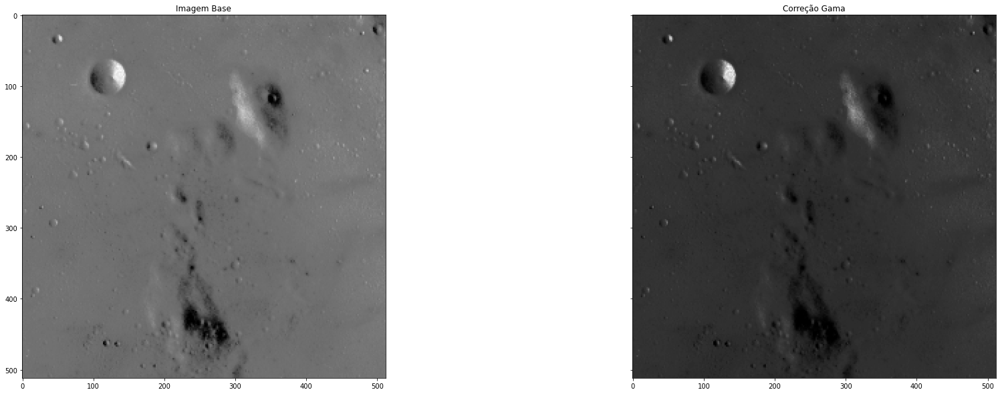

In [9]:
# Exemplo de Correção Gama

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def adjust_gamma_hsv(image, gamma):
  return skimg.exposure.adjust_gamma(image, gamma=gamma)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def adjust_gamma_each(image, gamma):
  return skimg.exposure.adjust_gamma(image, gamma=gamma)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da correção
gamma = 2

# Aplicação da correção Gama
image_corrected = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_corrected = skimg.exposure.adjust_gamma(image_base, gamma=gamma)
  colormap = "gray"
else:
  #image_corrected = adjust_gamma_hsv(image_base, gamma=gamma)
  image_corrected = adjust_gamma_each(image_base, gamma=gamma)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_corrected, cmap=colormap)
ax[1].set_title('Correção Gama')

### Correção Logarítmica

A correção Logarítmica faz com que valores mais escuros se tornem mais claros, fazendo detalhes presentes em aéreas escuras da imagem se tornarem mais visíveis.

Text(0.5, 1.0, 'Correção Logarítmica')

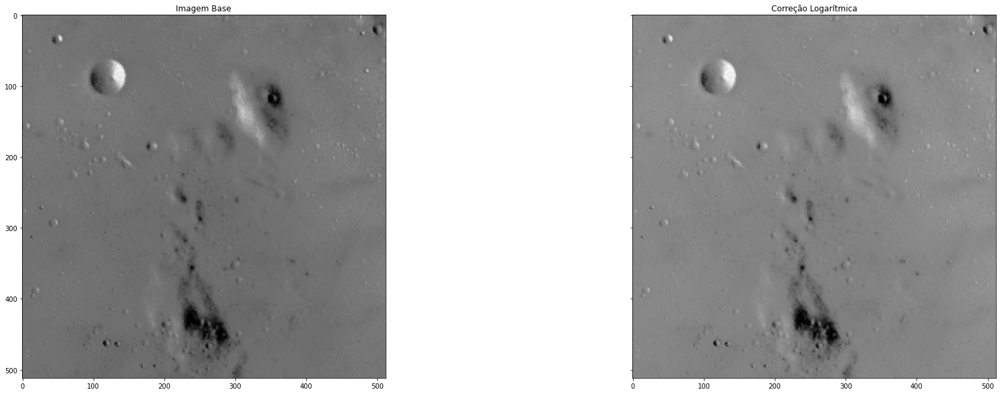

In [10]:
# Exemplo de Correção Logarítmica

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def adjust_log_hsv(image, gain):
  return skimg.exposure.adjust_log(image, gain=gain)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def adjust_log_each(image, gain):
  return skimg.exposure.adjust_log(image, gain=gain)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da correção
gain = 1

# Aplicação da correção Logarítmica
image_corrected = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_corrected = skimg.exposure.adjust_log(image_base, gain=gain)
  colormap = "gray"
else:
  #image_corrected = adjust_log_hsv(image_base, gain=gain)
  image_corrected = adjust_log_each(image_base, gain=gain)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_corrected, cmap=colormap)
ax[1].set_title('Correção Logarítmica')

### Correção Sigmoide

A correção Sigmoide, também conhecido como Ajuste de Contraste, permite modificar imagens de maneira similar a correção Logarítmica, mas com uma curva mais equilibrada e simétrica.

Text(0.5, 1.0, 'Correção Sigmoide')

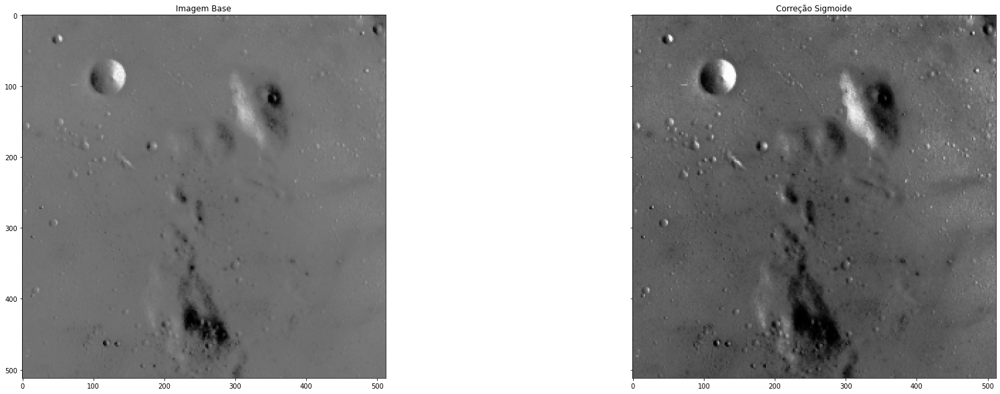

In [11]:
# Exemplo de Correção Sigmoide

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def adjust_sigmoid_hsv(image, cutoff, gain):
  return skimg.exposure.adjust_sigmoid(image, cutoff=cutoff, gain=gain)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def adjust_sigmoid_each(image, cutoff, gain):
  return skimg.exposure.adjust_sigmoid(image, cutoff=cutoff, gain=gain)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da correção
cutoff = 0.5
gain = 10

# Aplicação da correção Sigmoide
image_corrected = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_corrected = skimg.exposure.adjust_sigmoid(image_base, cutoff=cutoff, gain=gain)
  colormap = "gray"
else:
  #image_corrected = adjust_sigmoid_hsv(image_base, cutoff=cutoff, gain=gain)
  image_corrected = adjust_sigmoid_each(image_base, cutoff=cutoff, gain=gain)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_corrected, cmap=colormap)
ax[1].set_title('Correção Sigmoide')

### Equalização de Histograma

A equalização de histograma busca equalizar a distribuição de pixels em uma imagem automaticamente, baseada em seu histograma. É um método útil para imagens com fundo e frente que sejam ambos escuros ou ambos claros. Em particular, o método pode levar a uma melhor visualização da estrutura óssea em imagens de raios-x e melhores detalhes em fotografias super ou sub-expostas.

Muitas vezes produz resultados não realistas para fotografias, mas é bem útil para imagens cientificas como imagens térmicas, de satélite ou de rais-x. Tem a vantagem de não precisar de nenhum parâmetro.


Text(0.5, 1.0, 'Equalização de Histograma')

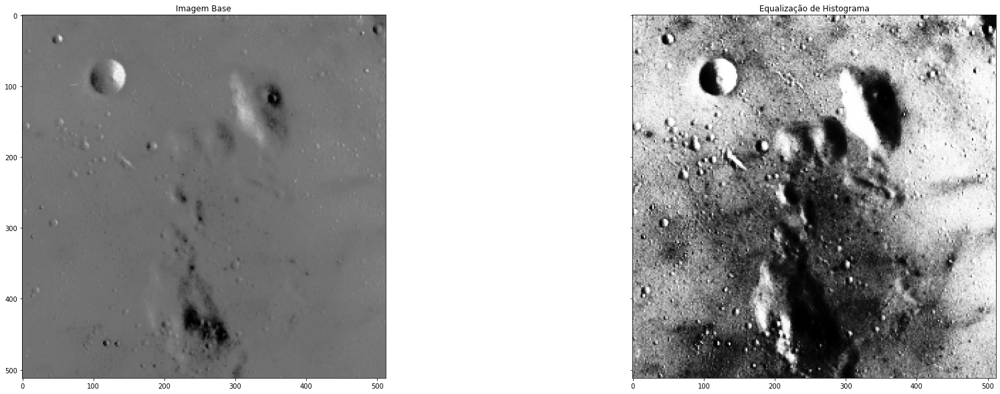

In [12]:
# Exemplo de Equalização de Histograma

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def equalize_hist_hsv(image, nbins):
  return skimg.exposure.equalize_hist(image, nbins=nbins)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def equalize_hist_each(image, nbins):
  return skimg.exposure.equalize_hist(image, nbins=nbins)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da correção
nbins = 256

# Aplicação da Equalização de Histograma
image_corrected = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_corrected = skimg.exposure.equalize_hist(image_base, nbins=nbins)
  colormap = "gray"
else:
  image_corrected = equalize_hist_hsv(image_base, nbins=nbins)
  #image_corrected = equalize_hist_each(image_base, nbins=nbins)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_corrected, cmap=colormap)
ax[1].set_title('Equalização de Histograma')

### Alongamento de Contraste

O alongamento de contraste é uma alternativa a equalização de histograma. A imagem é modificada para incluir apenas as intensidades que caem entre uma percentagem pré-definida, eliminando áreas muito escuras ou muito claras, gerando uma imagem mais natural do que a equalização de histograma.

Text(0.5, 1.0, 'Alongamento de Contraste')

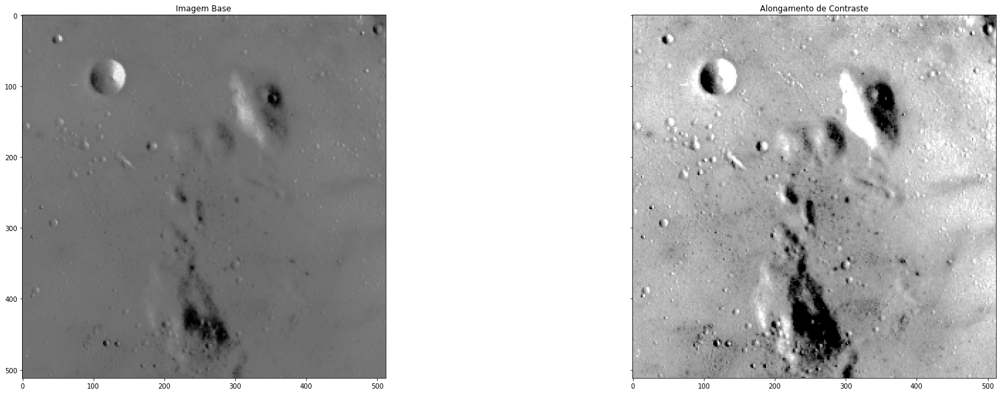

In [13]:
# Exemplo de Alongamento de Contraste

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def rescale_intensity_hsv(image, in_range):
  return skimg.exposure.rescale_intensity(image, in_range=in_range)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def rescale_intensity_each(image, in_range):
  return skimg.exposure.rescale_intensity(image, in_range=in_range)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da transformação
percent_low = 2
percent_high = 98

# Aplicação da Alongamento de Contraste
image_modified = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  p_low, p_high = np.percentile(image_base, (percent_low, percent_high))
  image_modified = skimg.exposure.rescale_intensity(image_base, in_range=(p_low, p_high))
  colormap = "gray"
else:
  p_low, p_high = np.percentile(image_base, (percent_low, percent_high))
  #image_modified = rescale_intensity_hsv(image_base, in_range=(p_low, p_high))
  image_modified = rescale_intensity_each(image_base, in_range=(p_low, p_high))
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_modified, cmap=colormap)
ax[1].set_title('Alongamento de Contraste')

### Equalização Adaptativa de Histograma Limitada por Contraste (CLAHE)

A equalização adaptativa de histograma limitada por contraste é um algoritmo que melhora o contraste local usando histogramas computados por diferentes regiões da imagem. Dessa forma, detalhes locais podem ser melhorados mesmo em regiões que são mais escurar ou mais claras que a maior parte da imagem.

Text(0.5, 1.0, 'Equalização Adaptativa de Histograma Limitada por Contraste')

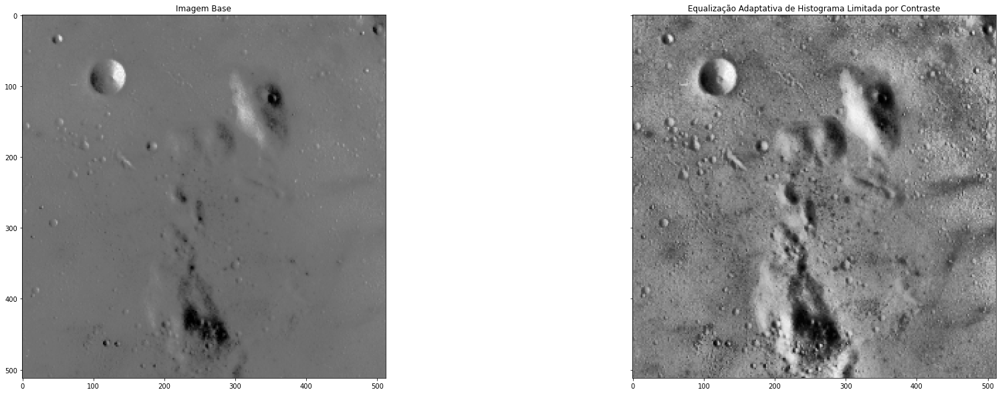

In [14]:
# Exemplo de Equalização Adaptativa de Histograma Limitada por Contraste

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def equalize_adapthist_hsv(image, clip_limit):
  return skimg.exposure.equalize_adapthist(image, clip_limit=clip_limit)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def equalize_adapthist_each(image, clip_limit):
  return skimg.exposure.equalize_adapthist(image, clip_limit=clip_limit)

# Carrega uma imagem de exemplo
image_base = skimg.data.moon()

# Parâmetros da transformação
clip_limit = 0.03

# Aplicação da Equalização Adaptativa de Histograma Limitada por Contraste
image_modified = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_modified = skimg.exposure.equalize_adapthist(image_base, clip_limit=clip_limit)
  colormap = "gray"
else:
  #image_modified = equalize_adapthist_hsv(image_base, clip_limit=clip_limit)
  image_modified = equalize_adapthist_each(image_base, clip_limit=clip_limit)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_modified, cmap=colormap)
ax[1].set_title('Equalização Adaptativa de Histograma Limitada por Contraste')

### Comparação Visual de Imagens

Durante modificações e transformações na imagem, se torna particularmente útil poder comparar com facilidade duas imagens.

Serão destacados três métodos de comparação.


#### Quadriculado/Tabuleiro de Xadrez

O método do quadriculado/tabuleiro de xadrez (checkerboard) alterna os blocos da primeira e da segunda imagens, gerando uma terceira imagem que permite fácil comparação entre as duas, em especial para imagens iguais.


Text(0.5, 1.0, 'Comparação Visual de Imagens por Quadriculado/Tabuleiro de Xadrez')

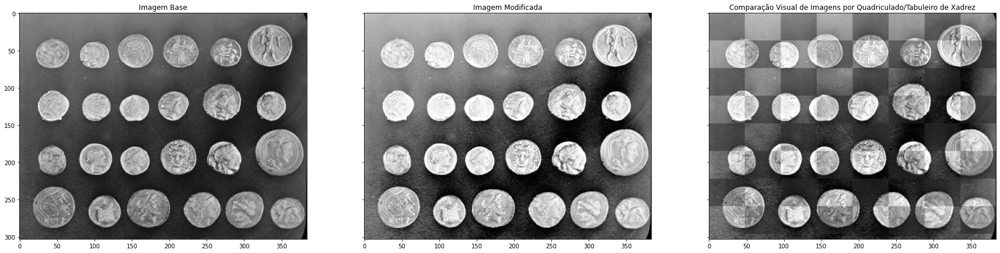

In [15]:
# Exemplo de Comparação Visual de Imagens por Quadriculado/Tabuleiro de Xadrez

# Carrega uma imagem de exemplo
image_base = skimg.data.coins()

# Aplicação da Comparação Visual de Imagens por Quadriculado/Tabuleiro de Xadrez
image_modified = np.zeros(np.shape(image_base))
image_comparison = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_modified = skimg.exposure.equalize_hist(image_base)
  image_comparison = skimg.util.compare_images(image_base, image_modified, method='checkerboard')
  colormap = "gray"
else:
  image_modified = equalize_hist_each(image_base, nbins=nbins)
  for color in range(np.size(image_base, axis=2)):
    image_comparison[:, :, color] = skimg.util.compare_images(image_base[:, :, color], image_modified[:, :, color], method='checkerboard')
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_modified, cmap=colormap)
ax[1].set_title('Imagem Modificada')
ax[2].imshow(image_comparison, cmap=colormap)
ax[2].set_title('Comparação Visual de Imagens por Quadriculado/Tabuleiro de Xadrez')

#### Diferença

O método da diferença (diff) calcula a diferença absoluta entre as duas imagens, gerando uma terceira imagem que permite comparar em especial imagens diferentes.


Text(0.5, 1.0, 'Comparação Visual de Imagens por Diferença')

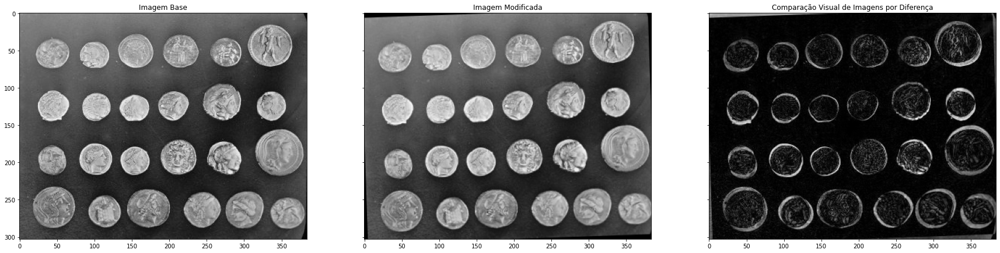

In [16]:
# Exemplo de Comparação Visual de Imagens por Diferença

# Carrega uma imagem de exemplo
image_base = skimg.data.coins()

# Parâmetros da transformação
angle = 2

# Aplicação da Comparação Visual de Imagens por Diferença
image_modified = np.zeros(np.shape(image_base))
image_comparison = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_modified = skimg.transform.rotate(image_base, angle)
  image_comparison = skimg.util.compare_images(image_base, image_modified, method='diff')
  colormap = "gray"
else:
  for color in range(np.size(image_base, axis=2)):
    image_modified[:, :, color] = skimg.transform.rotate(image_base[:, :, color], angle)
    image_comparison[:, :, color] = skimg.util.compare_images(image_base[:, :, color], image_modified[:, :, color], method='diff')
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_modified, cmap=colormap)
ax[1].set_title('Imagem Modificada')
ax[2].imshow(image_comparison, cmap=colormap)
ax[2].set_title('Comparação Visual de Imagens por Diferença')

#### Mistura

O método da mistura (blend) é o resultado da média das duas imagens, gerando uma terceira imagem que permite comparar em especial imagens diferentes.

Text(0.5, 1.0, 'Comparação Visual de Imagens por Mistura')

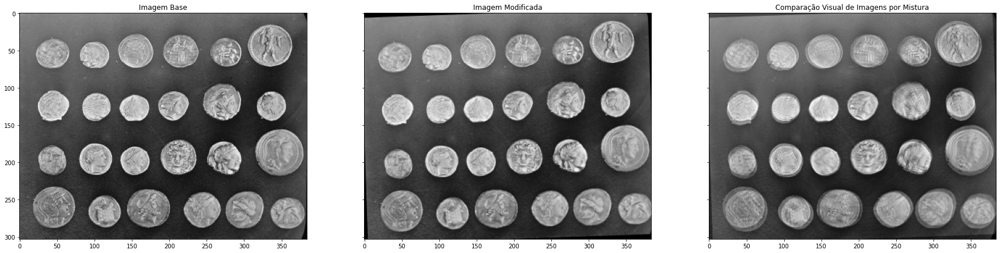

In [17]:
# Exemplo de Comparação Visual de Imagens por Mistura

# Carrega uma imagem de exemplo
image_base = skimg.data.coins()

# Parâmetros da transformação
angle = 2

# Aplicação da Comparação Visual de Imagens por Mistura
image_modified = np.zeros(np.shape(image_base))
image_comparison = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_modified = skimg.transform.rotate(image_base, angle)
  image_comparison = skimg.util.compare_images(image_base, image_modified, method='blend')
  colormap = "gray"
else:
  for color in range(np.size(image_base, axis=2)):
    image_modified[:, :, color] = skimg.transform.rotate(image_base[:, :, color], angle)
    image_comparison[:, :, color] = skimg.util.compare_images(image_base[:, :, color], image_modified[:, :, color], method='blend')
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap=colormap)
ax[0].set_title('Imagem Base')
ax[1].imshow(image_modified, cmap=colormap)
ax[1].set_title('Imagem Modificada')
ax[2].imshow(image_comparison, cmap=colormap)
ax[2].set_title('Comparação Visual de Imagens por Mistura')

### Remoção de Ruído por Aplicação de Filtro Mediano

Text(0.5, 1.0, 'Imagem filtrada com Filtro Mediano')

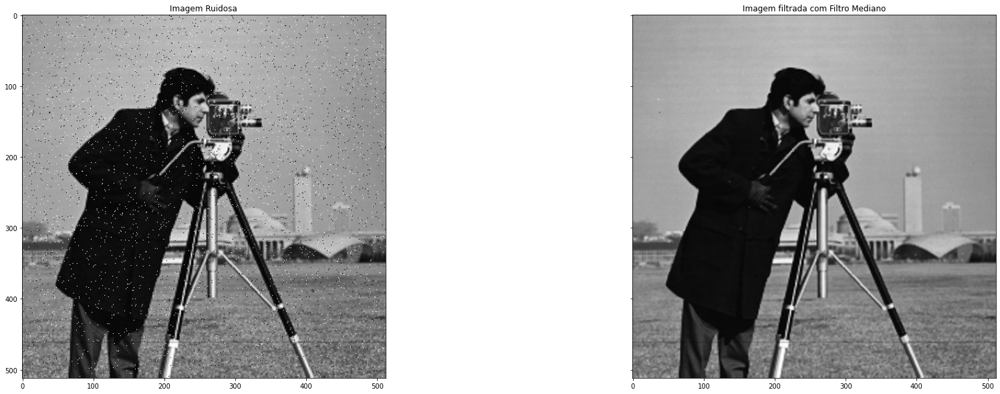

In [18]:
# Exemplo de Remoção de Ruído por Aplicação de Filtro Mediano

# Exemplo de Máscara de Nitidez

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def median_hsv(image, selem):
  return skimg.filters.rank.median(image, selem=selem)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def median_each(image, selem):
  return skimg.filters.rank.median(image, selem=selem)

# Carrega uma imagem de exemplo
image_base = skimg.data.camera()
noise = np.random.random(image_base.shape)

# Adiciona ruido a imagem
image_noisy = image_base
image_noisy[noise > 0.99] = 255
image_noisy[noise < 0.01] = 0

# Parâmetros da transformação
radius = 1

# Aplicação da Remoção de Ruído por Aplicação de Filtro Mediano
image_filtered = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_filtered = skimg.filters.rank.median(image_noisy, morphology.disk(radius))
  colormap = "gray"
else:
  #image_filtered = median_hsv(image_noisy, morphology.disk(radius))
  image_filtered = median_each(image_noisy, morphology.disk(radius))
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_noisy, cmap=colormap)
ax[0].set_title('Imagem Ruidosa')
ax[1].imshow(image_filtered, cmap=colormap)
ax[1].set_title('Imagem filtrada com Filtro Mediano')

### Remoção de Ruído por Aplicação de Filtro Médio

Text(0.5, 1.0, 'Imagem filtrada com Filtro Médio')

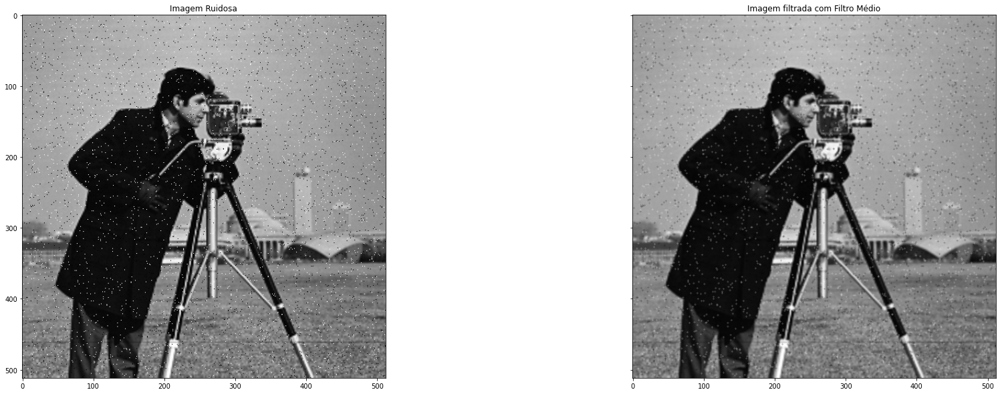

In [19]:
# Exemplo de Remoção de Ruído por Aplicação de Filtro Médio

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def mean_hsv(image, selem):
  return skimg.filters.rank.mean(image, selem=selem)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def mean_each(image, selem):
  return skimg.filters.rank.mean(image, selem=selem)

# Carrega uma imagem de exemplo
image_base = skimg.data.camera()
noise = np.random.random(image_base.shape)

# Adiciona ruido a imagem
image_noisy = image_base
image_noisy[noise > 0.99] = 255
image_noisy[noise < 0.01] = 0

# Parâmetros da transformação
radius = 1

# Aplicação da Remoção de Ruído por Aplicação de Filtro Médio
image_filtered = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_filtered = skimg.filters.rank.mean(image_noisy, morphology.disk(radius))
  colormap = "gray"
else:
  #image_filtered = mean_hsv(image_noisy, morphology.disk(radius))
  image_filtered = mean_each(image_noisy, morphology.disk(radius))
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_noisy, cmap=colormap)
ax[0].set_title('Imagem Ruidosa')
ax[1].imshow(image_filtered, cmap=colormap)
ax[1].set_title('Imagem filtrada com Filtro Médio')

### Remoção de Ruído por Aplicação de Filtro Médio Bilateral

Text(0.5, 1.0, 'Imagem filtrada com Filtro Médio Bilateral')

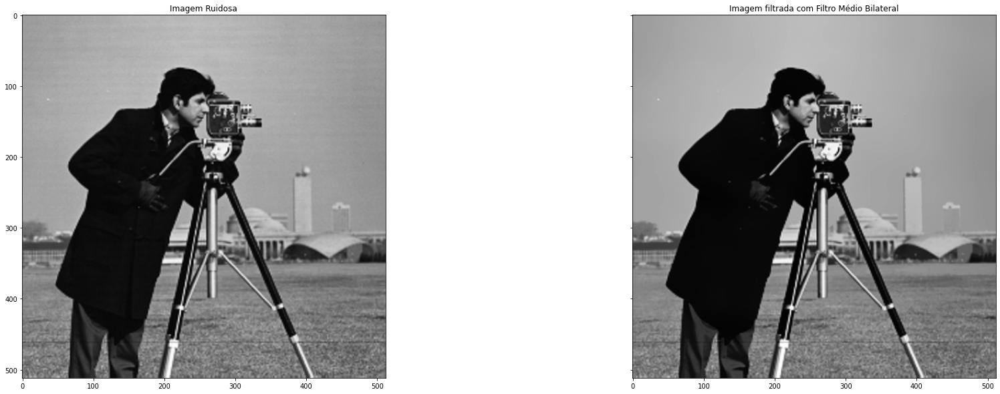

In [20]:
# Exemplo de Remoção de Ruído por Aplicação de Filtro Médio Bilateral

# Define funções de adaptação do filtro para imagens coloridas (HSV)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.hsv_value)
def mean_bilateral_hsv(image, selem, s0, s1):
  return skimg.filters.rank.mean_bilateral(image, selem=selem, s0=s0, s1=s1)

# Define funções de adaptação do filtro para imagens coloridas (RGB)
@skimg.color.adapt_rgb.adapt_rgb(skimg.color.adapt_rgb.each_channel)
def mean_bilateral_each(image, selem, s0, s1):
  return skimg.filters.rank.mean_bilateral(image, selem=selem, s0=s0, s1=s1)

# Carrega uma imagem de exemplo
image_base = skimg.data.camera()
noise = np.random.random(image_base.shape)

# Adiciona ruido a imagem
image_noisy = image_base
#image_noisy[noise > 0.99] = 255
#image_noisy[noise < 0.01] = 0

# Parâmetros da transformação
radius = 20

# Aplicação da Remoção de Ruído por Aplicação de Filtro Médio Bilateral
image_filtered = np.zeros(np.shape(image_base))
if (np.size(np.shape(image_base)) == 2):
  image_filtered = skimg.filters.rank.mean_bilateral(image_noisy, morphology.disk(radius), s0=10, s1=10)
  colormap = "gray"
else:
  #image_filtered = mean_bilateral_hsv(image_noisy, morphology.disk(radius), s0=10, s1=10)
  image_filtered = mean_bilateral_each(image_noisy, morphology.disk(radius), s0=10, s1=10)
  colormap = "viridis"

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_noisy, cmap=colormap)
ax[0].set_title('Imagem Ruidosa')
ax[1].imshow(image_filtered, cmap=colormap)
ax[1].set_title('Imagem filtrada com Filtro Médio Bilateral')

### Limiar (Thresholding)

O limiar (thresholding) é usado para gerar uma imagem binária (compostas apenas de 0 e 1, ou seja, preto e branco) a partir de uma imagem em escala de cinza.
Os algoritmos de limiar implementados no scikit-image podem ser separados em duas categorias:
* Baseado em histograma. O histograma é utilizado como referência e o limiar é aplicado globalmente na imagem;
* Local. Para processar um pixel, apenas os pixels vizinhos são utilizados. Geralmente esses algoritmos exigem maior tempo de processamento.


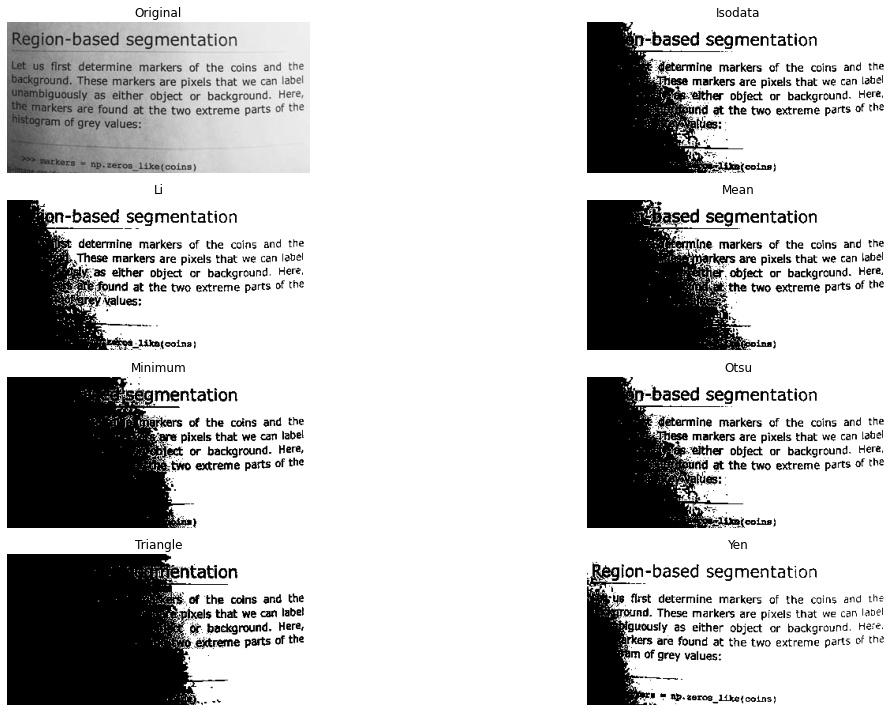

In [21]:
# Exemplo dos diferentes tipos de Limiar (Thresholding)

# Carrega uma imagem de exemplo
image_base = skimg.data.page()

# Exibe a imagem pelo MatPlotLib
fig, ax = skimg.filters.try_all_threshold(image_base, figsize=(20, 10), verbose=False)

### Limiar (Thresholding) Médio

Text(0.5, 1.0, 'Resultado do Limiar Médio')

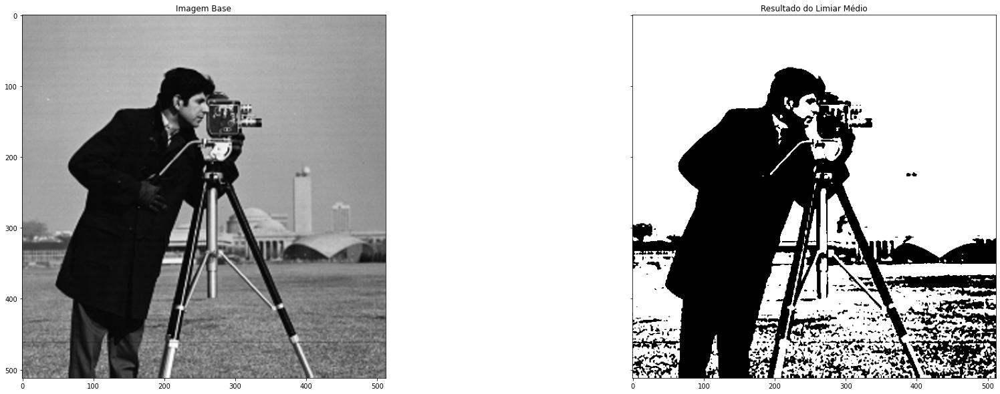

In [22]:
# Exemplo de Limiar (Thresholding) Médio 

# Carrega uma imagem de exemplo
image_base = skimg.data.camera()

# Converte de RGB para Grayscale se necessário
if (np.size(np.shape(image_base)) == 3):
  image_base = skimg.color.rgb2gray(image_base)

# Aplicação de Limiar (Thresholding) Médio
threshold = skimg.filters.threshold_mean(image_base)
image_binary = image_base > threshold

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap='gray')
ax[0].set_title('Imagem Base')
ax[1].imshow(image_binary, cmap='gray')
ax[1].set_title('Resultado do Limiar Médio')

### Limiar (Thresholding) Mínimo 

Text(0.5, 1.0, 'Resultado do Limiar Mínimo')

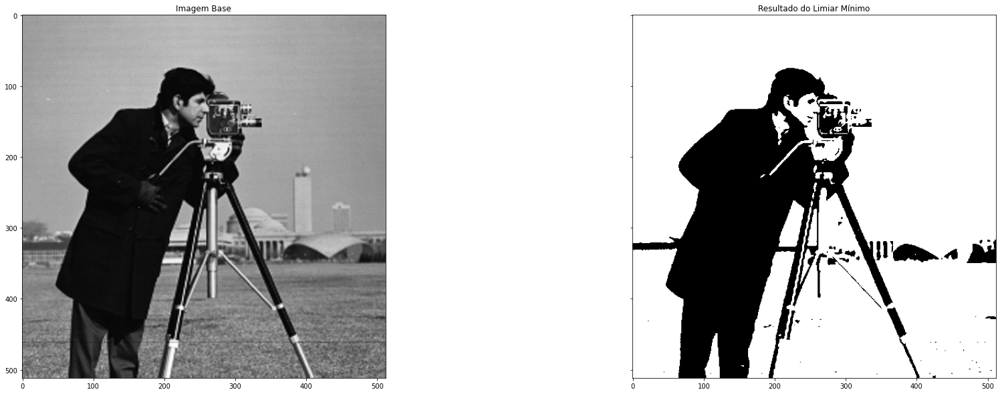

In [23]:
# Exemplo de Limiar (Thresholding) Mínimo 

# Carrega uma imagem de exemplo
image_base = skimg.data.camera()

# Converte de RGB para Grayscale se necessário
if (np.size(np.shape(image_base)) == 3):
  image_base = skimg.color.rgb2gray(image_base)

# Aplicação de Limiar (Thresholding) Mínimo
threshold = skimg.filters.threshold_minimum(image_base)
image_binary = image_base > threshold

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap='gray')
ax[0].set_title('Imagem Base')
ax[1].imshow(image_binary, cmap='gray')
ax[1].set_title('Resultado do Limiar Mínimo')

### Limiar (Thresholding) Local

Text(0.5, 1.0, 'Resultado do Limiar Local')

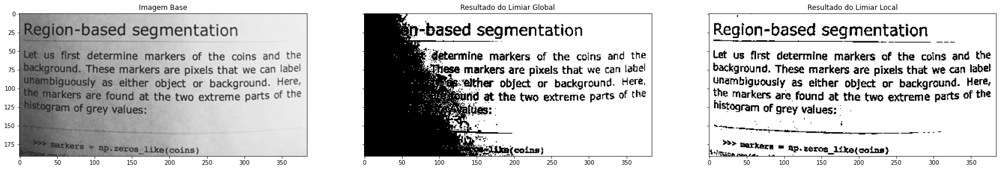

In [24]:
# Exemplo de Limiar (Thresholding) Local 

# Carrega uma imagem de exemplo
image_base = skimg.data.page()

# Converte de RGB para Grayscale se necessário
if (np.size(np.shape(image_base)) == 3):
  image_base = skimg.color.rgb2gray(image_base)

# Parâmetros da transformação
block_size = 35
offset = 10

# Aplicação de Limiar (Thresholding) Global
threshold_global = skimg.filters.threshold_otsu(image_base)
image_binary_global = image_base > threshold_global

# Aplicação de Limiar (Thresholding) Local
threshold_local = skimg.filters.threshold_local(image_base, block_size, offset=offset)
image_binary_local = image_base > threshold_local

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap='gray')
ax[0].set_title('Imagem Base')
ax[1].imshow(image_binary_global, cmap='gray')
ax[1].set_title('Resultado do Limiar Global')
ax[2].imshow(image_binary_local, cmap='gray')
ax[2].set_title('Resultado do Limiar Local')

### Esqueletização

A esqueletização é utilizada para reduzir os componentes em uma imagem binária para um esqueleto de um único pixel de largura. Só pode ser utilizado com imagens binárias.

Pode ser utilizada para caracterização de imagem ou então para comparação de características (comparação de impressões digitais, por exemplo).


Text(0.5, 1.0, 'Imagem Esqueletizada')

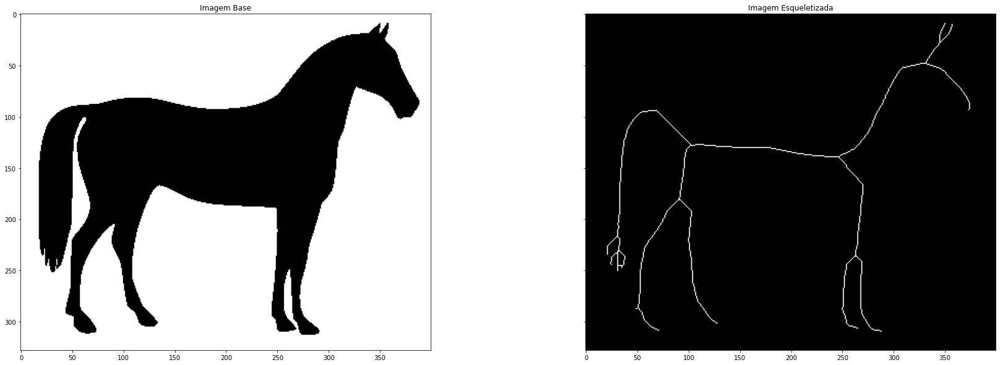

In [25]:
# Exemplo de Esqueletização

# Carrega uma imagem de exemplo
image_base = skimg.data.horse()

# Aplicação de Esqueletização
image_skeletonize = morphology.skeletonize(image_base == 0)

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_base, cmap='gray')
ax[0].set_title('Imagem Base')
ax[1].imshow(image_skeletonize, cmap='gray')
ax[1].set_title('Imagem Esqueletizada')

### Correspondência de Modelo

A correspondência de modelo pode ser usada para identificar a ocorrência de um pedaço de imagem em uma imagem maior. No caso, será localizada uma moeda especifica no meio de todas as moedas. Como todas as moedas são similares, teremos um máximo global a cada moeda da imagem, mas apenas um máximo global.


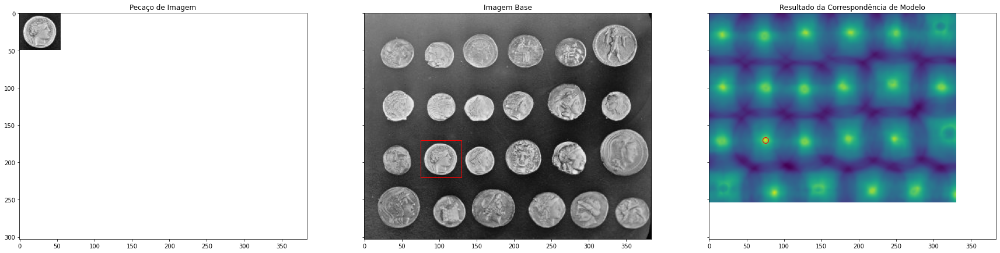

In [26]:
# Exemplo de Correspondência de Modelo

# Carrega uma imagem de exemplo
image_base = skimg.data.coins()
patch_coin = image_base[170:220, 75:130]

# Aplicação da Correspondência de Modelo
image_result = feature.match_template(image_base, patch_coin)
ij = np.unravel_index(np.argmax(image_result), image_result.shape)
x, y = ij[::-1]

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True);
ax[0].imshow(patch_coin, cmap="gray")
ax[0].set_title('Pecaço de Imagem')
ax[1].imshow(image_base, cmap="gray")
ax[1].set_title('Imagem Base')
ax[2].imshow(image_result)
ax[2].set_title('Resultado da Correspondência de Modelo')

# Destaca a região de correspondência
hcoin, wcoin = patch_coin.shape
highlight_coin = plt.Rectangle((x, y), wcoin, hcoin, edgecolor='r', facecolor='none')
ax[1].add_patch(highlight_coin)

# Destaca a região de correspondência
ax[2].plot(x, y, 'o', markeredgecolor='r', markerfacecolor='none', markersize=10)


### Restauração de Imagem

Alguns possíveis algoritmos para restaurações de imagem são os filtros de Variação Total, Bilateral e Wavelet.
* O filtro de variação total resulta em uma imagem com a mínima variação total de sua norma, enquanto se mantem o mais próximo possível da imagem inicial;
* O filtro bilateral é um filtro que preserva as bordas e reduz ruídos. Ele realiza a média dos pixels baseado em sua proximidade espacial e similaridade radiometrica;
* O filtro de wavelet depende da representação de wavelet da imagem. Os rúidos são representados como valores pequenos no domínio wavelet, que são jogados para 0.


Text(0.5, 1.0, 'Restauração por Wavelet')

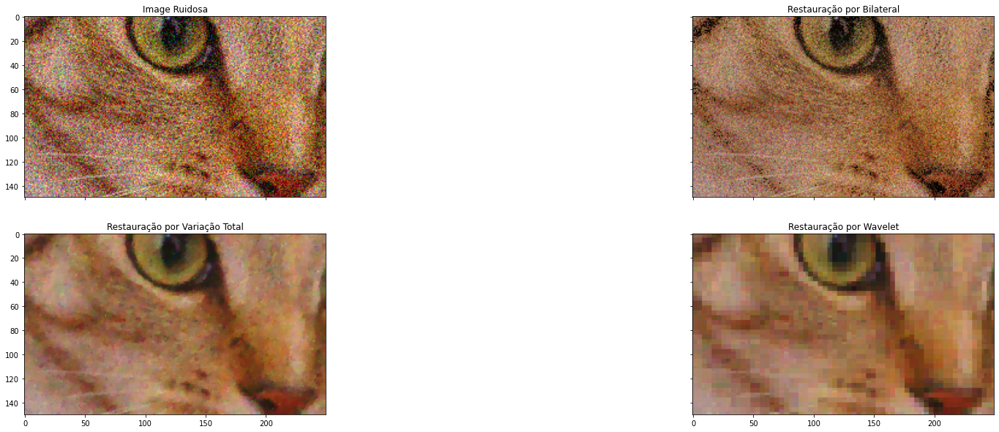

In [27]:
# Exemplo de Restauração de Imagem

# Carrega uma imagem de exemplo
image_base = skimg.data.chelsea()[100:250, 50:300]

# Geração da imagem com ruído
noise_sigma = 0.155
image_noisy = skimg.util.random_noise(image_base, var=noise_sigma**2)

# Parametros da Restauração de Imagem
weight = 0.1
sigma_color = 0.05
sigma_spatial = 15

# Aplicação de Restauração de Imagem
image_restored_tv_chambolle = skimg.restoration.denoise_tv_chambolle(image_noisy, weight=weight, multichannel=True)
image_restored_bilateral = skimg.restoration.denoise_bilateral(image_noisy, sigma_color=sigma_color, sigma_spatial=sigma_spatial, multichannel=True)
image_restored_wavelet = skimg.restoration.denoise_wavelet(image_noisy, multichannel=True, rescale_sigma=True)

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True);
ax[0, 0].imshow(image_noisy)
ax[0, 0].set_title('Image Ruidosa')
ax[1, 0].imshow(image_restored_tv_chambolle)
ax[1, 0].set_title('Restauração por Variação Total')
ax[0, 1].imshow(image_restored_bilateral)
ax[0, 1].set_title('Restauração por Bilateral')
ax[1, 1].imshow(image_restored_wavelet)
ax[1, 1].set_title('Restauração por Wavelet')


### Restauração (Deconvolução) por Wiener Não-Supervisionado

A restauração (deconvolução) por filtro de Wiener é um método linear que tem dificuldades de restaurar bordas afiadas tão bem quanto outro métodos não-lineares, mas possuem muito mais velocidade.

* O filtro de Wiener é baseado em uma Função de Propagação de Ponto (Point Spread Function, PSF) e o parâmetro de regularização deve ser manualmente ajustado.

* O filtro de Wiener Não-Supervisionado faz a regularização automaticamente de maneira iterativa.


Text(0.5, 1.0, 'Restauração por Wiener Não-Supervisionado')

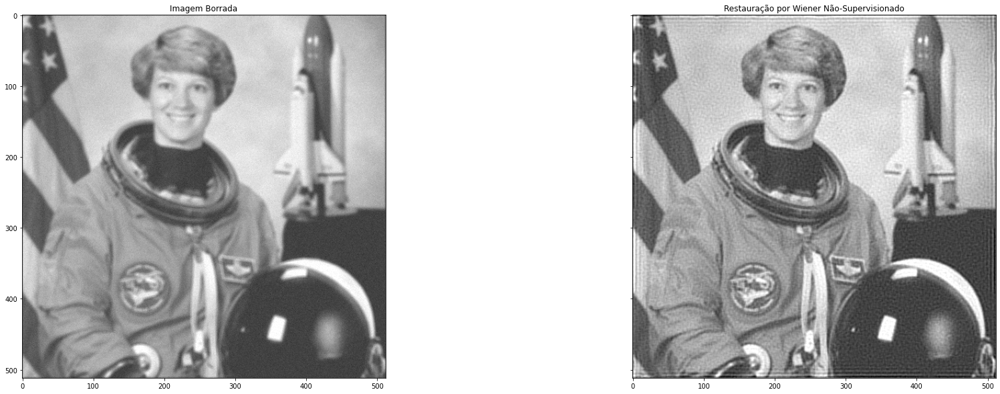

In [28]:
# Exemplo de Restauração (Deconvolução) por Wiener Não-Supervisionado

# Carrega uma imagem de exemplo
image_base = skimg.data.astronaut()

# Converte de RGB para Grayscale se necessário
if (np.size(np.shape(image_base)) == 3):
  image_base = skimg.color.rgb2gray(image_base)

# Aplicação de Restauração (Deconvolução) por Wiener Não-Supervisionado
point_spread_function = np.ones((5, 5)) / 25
image_astro = signal.convolve2d(image_base, point_spread_function, 'same')
image_astro += 0.1 * image_astro.std() * np.random.standard_normal(image_astro.shape)
deconvolved, _ = skimg.restoration.unsupervised_wiener(image_astro, point_spread_function)

# Exibe a imagem pelo MatPlotLib
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True);
ax[0].imshow(image_astro, vmin=deconvolved.min(), vmax=deconvolved.max(), cmap='gray')
ax[0].set_title('Imagem Borrada')
ax[1].imshow(deconvolved, cmap='gray')
ax[1].set_title('Restauração por Wiener Não-Supervisionado')
